<a href="https://colab.research.google.com/github/leodutra/ed-spectrogram/blob/master/Elite_Dangerous_Station_Antenna%20v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Imports all the necessary libraries and sets up a warning filter.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy import signal
import cv2
import warnings

# --- SPECTROGRAM PARAMETERS ---
NFFT_val = 4096  # frequency detail
noverlap_val = 2048 # transitions

# Suppress UserWarning from matplotlib about locator being used with a log-scale
warnings.filterwarnings("ignore", category=UserWarning, module='matplotlib')

Load wave file

In [ ]:
# --- 1. SPECIFY YOUR AUDIO FILE ---
# !!! IMPORTANT !!!
# Replace 'YOUR_FILE_HERE.wav' with the actual path to your WAV file.
audio_file = '/content/JamesonMemorialNS.wav'

# --- 2. LOAD AUDIO ---
try:
    sample_rate, samples = wavfile.read(audio_file)
    # --- FIX for ValueError ---
    # The error can occur if the audio is stereo. We check for this and convert to mono.
    if samples.ndim > 1 and samples.shape[1] > 1:
        print("Stereo audio detected. Converting to mono by averaging channels.")
        samples = samples.mean(axis=1)
    print(f"Successfully loaded '{audio_file}'.")

except FileNotFoundError:
    print(f"Error: The file '{audio_file}' was not found.")
    print("Please make sure the file path is correct and the file is in the same directory as the script, or provide the full path.")
    # Create a dummy signal to prevent further errors if file not found
    sample_rate = 44100
    samples = np.zeros(44100) # Create 1s of silence


Stereo audio detected. Converting to mono by averaging channels.
Successfully loaded '/content/JamesonMemorialNS.wav'.


Generates and displays the spectrogram for the original, unfiltered audio data

Plotting the original, unfiltered spectrogram...


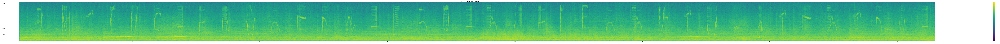

In [44]:
# --- 3. PLOT THE RAW, UNFILTERED SPECTROGRAM ---
print("Plotting the original, unfiltered spectrogram...")

# --- THIS IS THE ONLY ADDED LINE ---
# Dynamically calculate the figure width based on signal length and FFT parameters.
fig_width = len(samples) / sample_rate * 1 # inches per second of audio. Adjust as needed.

fig, ax = plt.subplots(figsize=(fig_width, 7)) # Use the dynamic width

# Plot the original, noisy spectrogram
Pxx, freqs, bins, im = ax.specgram(samples, NFFT=NFFT_val, Fs=sample_rate, noverlap=noverlap_val, cmap='viridis')
ax.set_title('Original Spectrogram (with noise)')
ax.set_xlabel('Time [s]')
ax.set_ylabel('Frequency [Hz]')
ax.set_ylim(0, 12500)
ax.set_aspect('auto') # Force aspect ratio to fill horizontal space

fig.colorbar(im, ax=ax, format='%+2.0f dB')
plt.tight_layout()
plt.show()